In [1]:
%config InlineBackend.figure_format = "retina" # High-res graphs (rendered irrelevant by svg option below)
%config InlineBackend.print_figure_kwargs = {"bbox_inches": "tight"} # No extra white space
%config InlineBackend.figure_format = "svg" # 'png' is default

from IPython.core.debugger import set_trace
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress
import scipy as sp
import seaborn as sns

In [2]:
dataFolder = "../Data/WizardGemsData"
files = os.listdir(dataFolder)

In [3]:
colNames = (
    ["correct_response", "response"]
    + ["bars" + str(i) for i in np.arange(5) + 1]
    + ["weights" + str(i) for i in np.arange(5) + 1]
    + ["condition", "RT"]
)

In [4]:
dataList = []
data = pd.DataFrame()
for file in files:
    dataSub = pd.read_csv(
        dataFolder + "/" + file,
        usecols=[0, 1, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
        names=colNames,
        skiprows=[0],
    )
    dataSub.insert(
        loc=0,
        column="sub",
        value=int("".join([file[i] for i in np.arange(3, file.find("_"))])),
    )
    dataSub.insert(loc=1, column="NTrials", value=dataSub.shape[0])
    dataSub.insert(loc=2, column="iTrial", value=np.arange(dataSub.shape[0]) + 1)
    dataSub.insert(loc=3, column="block", value=np.ceil(dataSub["iTrial"].values / 10))
    dataSub.insert(loc=3, column="NBlocks", value=dataSub["block"].max())
    dataList.append(dataSub)
    data = data.append(dataSub)

In [5]:
data.head(30)

,sub,NTrials,iTrial,NBlocks,block,correct_response,response,bars1,bars2,bars3,bars4,bars5,weights1,weights2,weights3,weights4,weights5,condition,RT
0,101,500,1,50.0,1.0,65.68,51.440430,77,2,63,75,50,0.12,0.02,0.55,0.25,0.06,1,8.965760
1,101,500,2,50.0,1.0,49.63,77.141602,22,20,76,17,9,0.12,0.02,0.55,0.25,0.06,1,13.135055
2,101,500,3,50.0,1.0,27.79,65.236328,69,95,0,51,81,0.12,0.02,0.55,0.25,0.06,1,10.565004
3,101,500,4,50.0,1.0,51.97,88.688477,61,72,29,92,71,0.12,0.02,0.55,0.25,0.06,1,10.948676
4,101,500,5,50.0,1.0,46.50,49.091797,54,14,37,67,44,0.12,0.02,0.55,0.25,0.06,1,33.180578
5,101,500,6,50.0,1.0,54.30,48.873047,43,62,51,65,60,0.12,0.02,0.55,0.25,0.06,1,7.811569
6,101,500,7,50.0,1.0,69.35,54.653320,81,52,91,32,9,0.12,0.02,0.55,0.25,0.06,1,14.227847
7,101,500,8,50.0,1.0,54.50,60.660156,30,11,83,5,63,0.12,0.02,0.55,0.25,0.06,1,9.732463
8,101,500,9,50.0,1.0,42.84,60.791016,55,82,20,86,35,0.12,0.02,0.55,0.25,0.06,1,6.278436
9,101,500,10,50.0,1.0,67.27,63.635742,75,30,88,33,17,0.12,0.02,0.55,0.25,0.06,1,7.102123


In [6]:
subList = data["sub"].unique()
NSub = len(subList)

### Absolute error over time

In [7]:
data["absError"] = np.abs(data["correct_response"] - data["response"])

Text(0.5, 0, 'trial')

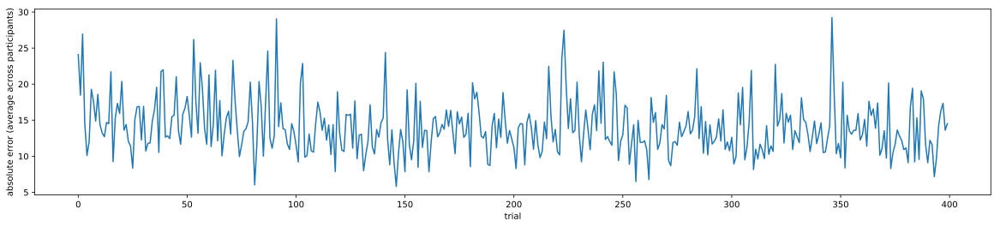

In [8]:
learningCurves = np.empty((NSub, data["NTrials"].max()))
learningCurves[:] = np.nan
plt.subplots(1, 1, figsize=(20, 4))
for iSub, sub in enumerate(subList):
    dataSub = data[data["sub"] == sub]
    learningCurves[iSub, np.arange(dataSub.loc[0, "NTrials"])] = dataSub[
        "absError"
    ].values
plt.plot(np.mean(learningCurves, axis=0))
plt.ylabel("absolute error (average across participants)")
plt.xlabel("trial")

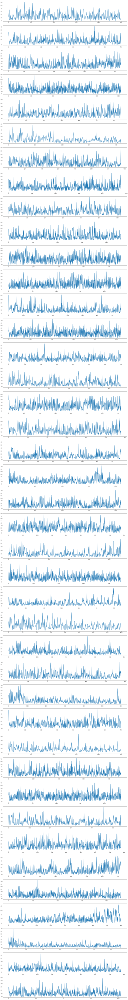

In [9]:
fig, axes = plt.subplots(len(subList), 1, figsize=(20, 4 * len(subList)))
for iSub, sub in enumerate(subList):
    axes[iSub].plot(data.loc[data["sub"] == sub, "absError"])

condition
0    13.605326
1    14.591797
Name: absError, dtype: float64


Text(0, 0.5, 'absolute error')

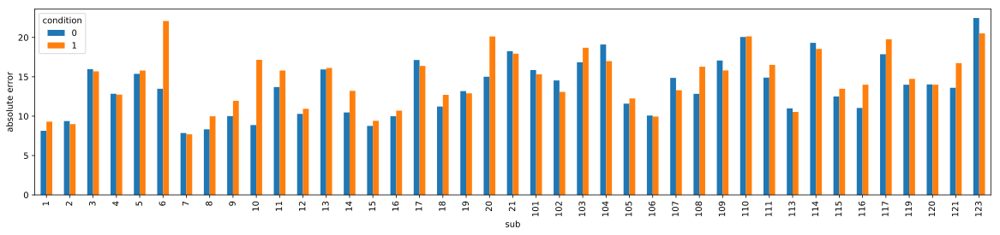

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(20, 4))
data.groupby(["sub", "condition"]).mean()["absError"].unstack().plot(kind="bar", ax=ax)
print(data.groupby(["sub", "condition"]).mean()["absError"].groupby("condition").mean())
ax.set_ylabel("absolute error")

half
1    14.361958
2    13.835164
Name: absError, dtype: float64


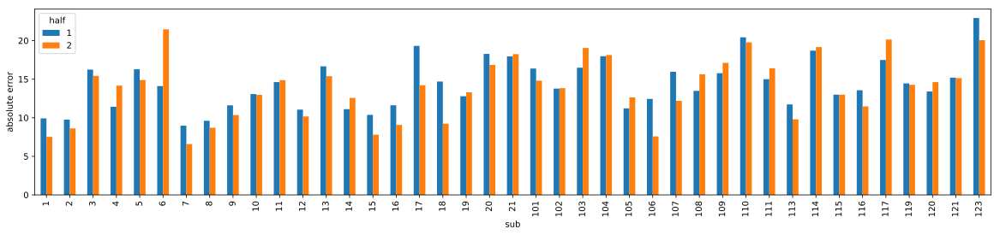

In [11]:
datatmp = data.copy()
datatmp["half"] = 1 * (datatmp["iTrial"] <= datatmp["NTrials"] / 2) + 2 * (
    datatmp["iTrial"] > datatmp["NTrials"] / 2
)
fig, ax = plt.subplots(1, 1, figsize=(20, 4))
datatmp.groupby(["sub", "half"]).mean()["absError"].unstack().plot(kind="bar", ax=ax)
ax.set_ylabel("absolute error")
print(datatmp.groupby(["sub", "half"]).mean()["absError"].groupby("half").mean())

### Test whether people (percentage of participants) are using the information of each of the bars

#### try correlation with sliding windows

C:\Users\rahon\Anaconda3\lib\site-packages\scipy\stats\stats.py:3038: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den
C:\Users\rahon\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in less


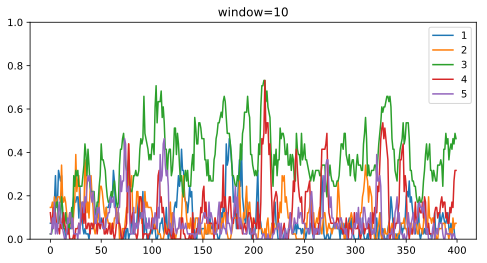

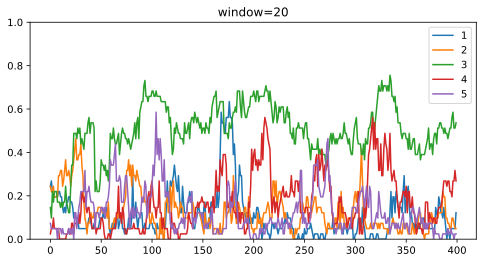

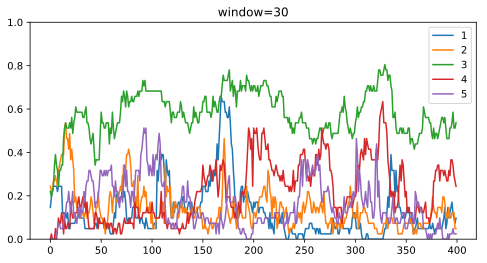

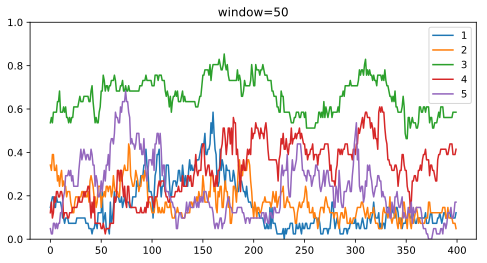

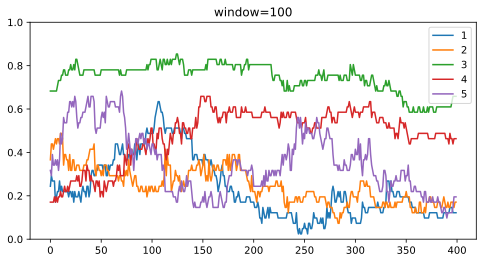

In [12]:
for window in [10, 20, 30, 50, 100]:
    cols = ["bars" + str(i + 1) for i in range(5)]
    pMat = np.empty((NSub, data["NTrials"].max() - window, 5))
    pMat[:] = np.nan
    for iSub, sub in enumerate(subList):
        dataSub = data[(data["sub"] == sub)].copy().reset_index(drop=True)
        for i in np.arange(dataSub.loc[0, "NTrials"] - window):
            dataWindow = dataSub.iloc[i : i + window]
            for iBar in range(5):
                r, p = sp.stats.pearsonr(
                    dataWindow["response"], dataWindow["bars" + str(iBar + 1)]
                )
                pMat[iSub, i, iBar] = p
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))
    for iBar in range(5):
        ax.plot(
            np.nanmean(pMat[:, range(data["NTrials"].min()), iBar] < 0.05, axis=0),
            label=iBar + 1,
        )
    ax.legend()
    ax.set_ylim([0, 1])
    ax.set_title("window=" + str(window))

#### try linear regression (with a constant term) with sliding windows

C:\Users\rahon\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in less


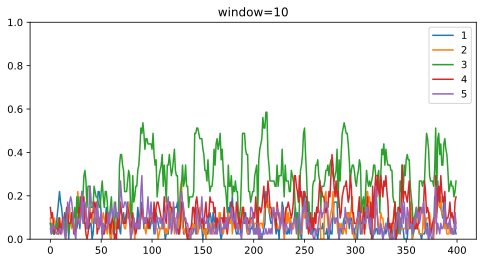

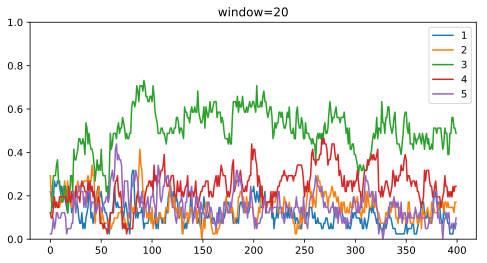

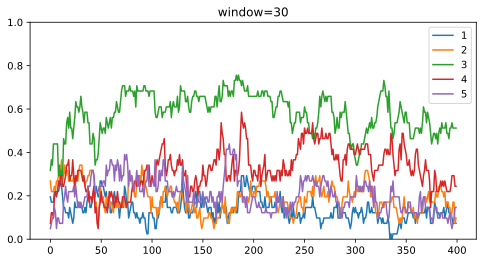

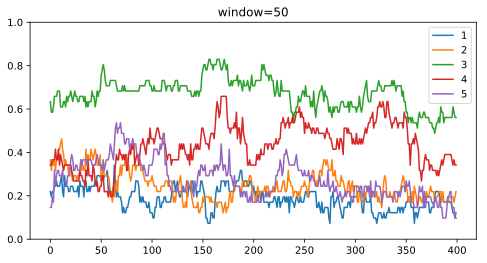

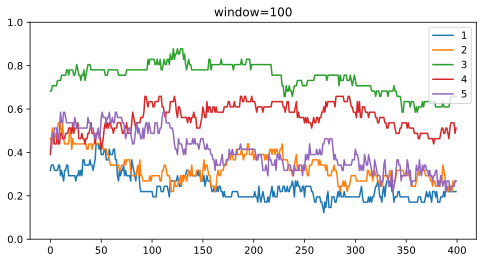

In [13]:
import statsmodels.api as sm

for window in [10, 20, 30, 50, 100]:
    cols = ["bars" + str(i + 1) for i in range(5)]
    pMat = np.empty((NSub, data["NTrials"].max() - window, 5))
    pMat[:] = np.nan
    #     inCIMat = np.empty((NSub, data['NTrials'].max()-window, 5))
    #     inCIMat[:] = np.nan
    for iSub, sub in enumerate(subList):
        dataSub = data[(data["sub"] == sub)].copy().reset_index(drop=True)
        for i in np.arange(dataSub.loc[0, "NTrials"] - window):
            dataWindow = dataSub.iloc[i : i + window]
            X = dataWindow[cols].values
            y = dataWindow["response"].values
            X = sm.add_constant(X)
            mod = sm.OLS(y, X)
            res = mod.fit()
            pMat[iSub, i, :] = res.pvalues[1:]
    #             trueBeta = dataSub.loc[0,'weights'+str(iBar+1)]
    #             inCIMat[iSub, i, iBar] = (res.conf_int().loc['bars'+str(iBar+1),1] > trueBeta) & (res.conf_int().loc['bars'+str(iBar+1),0] < trueBeta)
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))
    for iBar in range(5):
        ax.plot(
            np.nanmean(pMat[:, range(data["NTrials"].min()), iBar] < 0.05, axis=0),
            label=iBar + 1,
        )
    ax.legend()
    ax.set_ylim([0, 1])
    ax.set_title("window=" + str(window))

#### try correlation with every few blocks

C:\Users\rahon\Anaconda3\lib\site-packages\scipy\stats\stats.py:3038: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den
C:\Users\rahon\Anaconda3\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in less


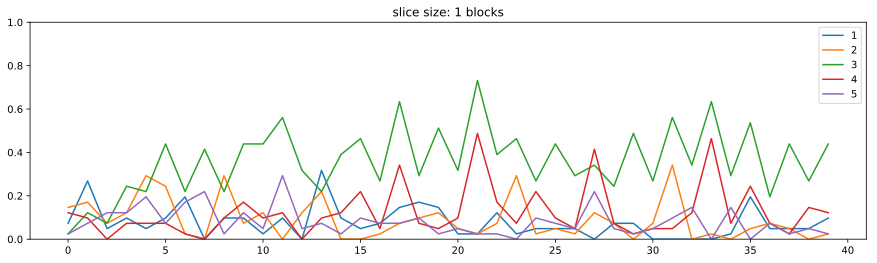

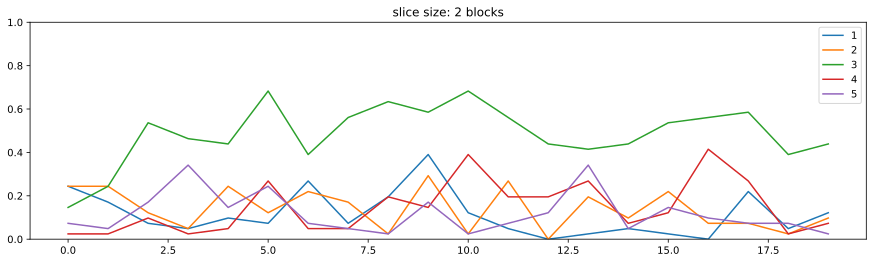

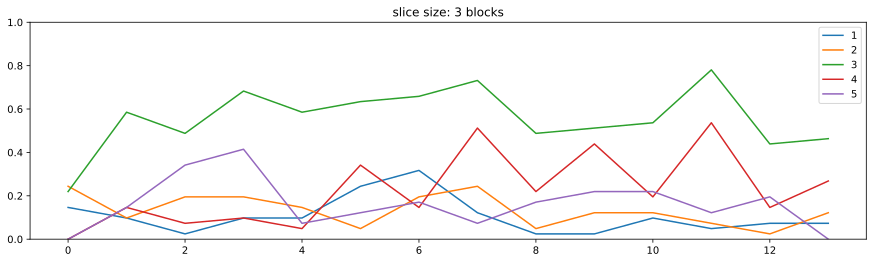

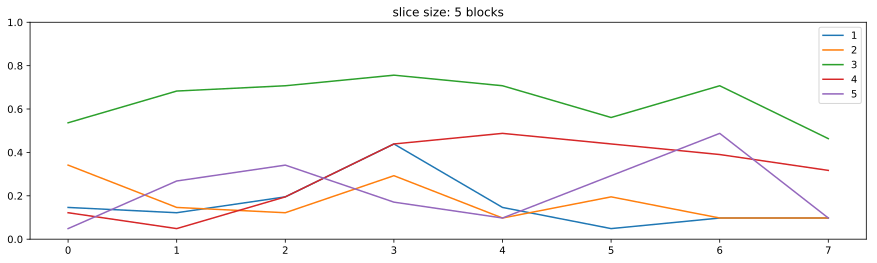

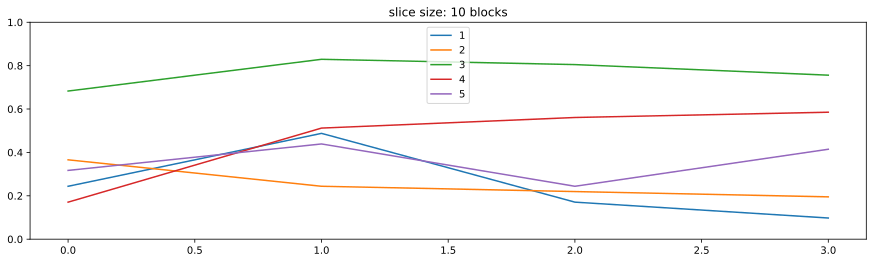

In [14]:
nTrialsPerBlock = 10
for nBlocks in [1, 2, 3, 5, 10]:
    sliceSize = nBlocks * nTrialsPerBlock
    cols = ["bars" + str(i + 1) for i in range(5)]
    pMat = np.empty((NSub, int(np.ceil(data["NTrials"].max() / sliceSize)), 5))
    pMat[:] = np.nan
    for iSub, sub in enumerate(subList):
        dataSub = data[(data["sub"] == sub)].copy().reset_index(drop=True)
        for i in range(int(np.ceil(dataSub.loc[0, "NTrials"] / sliceSize) - 1)):
            dataSlice = dataSub.iloc[
                int(i * sliceSize) : int(
                    np.min([(i + 1) * sliceSize, dataSub.shape[0]])
                )
            ]
            for iBar in range(5):
                r, p = sp.stats.pearsonr(
                    dataSlice["response"], dataSlice["bars" + str(iBar + 1)]
                )
                pMat[iSub, i, iBar] = p
    fig, ax = plt.subplots(1, 1, figsize=(15, 4))
    for iBar in range(5):
        ax.plot(
            np.nanmean(
                pMat[:, range(int(np.ceil(data["NTrials"].min() / sliceSize))), iBar]
                < 0.05,
                axis=0,
            ),
            label=iBar + 1,
        )
    ax.legend()
    ax.set_ylim([0, 1])
    ax.set_title("slice size: " + str(nBlocks) + " blocks")

#### try linear regression (with a constant term) with every few blocks

C:\Users\rahon\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in less


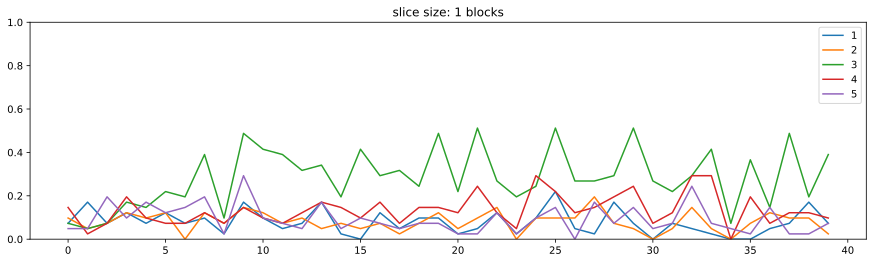

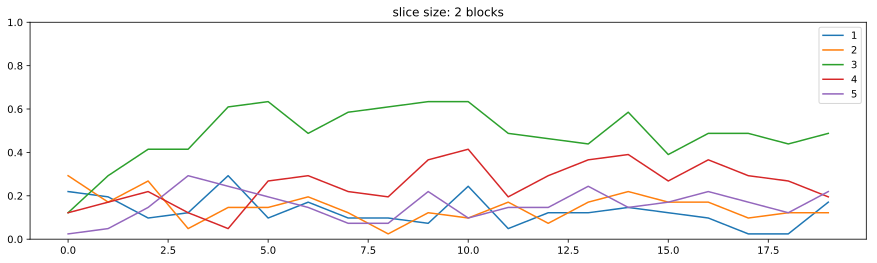

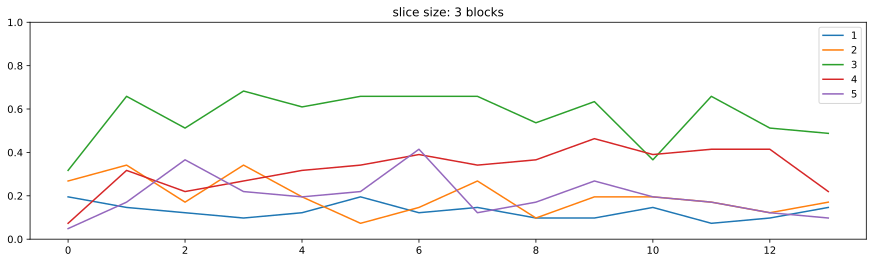

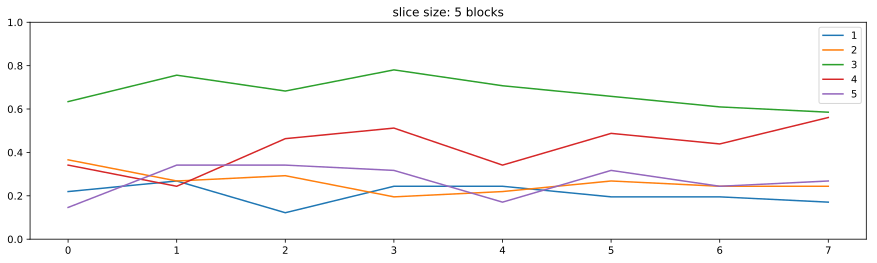

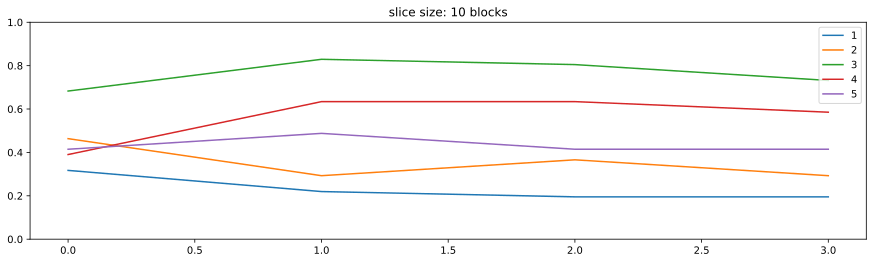

In [15]:
import statsmodels.api as sm

nTrialsPerBlock = 10
for nBlocks in [1, 2, 3, 5, 10]:
    sliceSize = nBlocks * nTrialsPerBlock
    cols = ["bars" + str(i + 1) for i in range(5)]
    pMat = np.empty((NSub, int(np.ceil(data["NTrials"].max() / sliceSize)), 5))
    pMat[:] = np.nan
    for iSub, sub in enumerate(subList):
        dataSub = data[(data["sub"] == sub)].copy().reset_index(drop=True)
        for i in range(int(np.ceil(dataSub.loc[0, "NTrials"] / sliceSize) - 1)):
            dataSlice = dataSub.iloc[
                int(i * sliceSize) : int(
                    np.min([(i + 1) * sliceSize, dataSub.shape[0]])
                )
            ]
            X = dataSlice[cols].values
            y = dataSlice["response"].values
            X = sm.add_constant(X)
            mod = sm.OLS(y, X)
            res = mod.fit()
            pMat[iSub, i, :] = res.pvalues[1:]
    fig, ax = plt.subplots(1, 1, figsize=(15, 4))
    for iBar in range(5):
        ax.plot(
            np.nanmean(
                pMat[:, range(int(np.ceil(data["NTrials"].min() / sliceSize))), iBar]
                < 0.05,
                axis=0,
            ),
            label=iBar + 1,
        )
    ax.legend()
    ax.set_ylim([0, 1])
    ax.set_title("slice size: " + str(nBlocks) + " blocks")

In [16]:
# %load_ext rpy2.ipython

In [17]:
# %%R -i df -o resid -o fitted

### Estimate the coefficients people use

#### with sliding windows

In [18]:
beta = [0.12, 0.02, 0.55, 0.25, 0.06]

In [19]:
import statsmodels.api as sm

# sliding window to estimate model params
window = 50

fig, axes = plt.subplots(len(subList), 1, figsize=(20, 4 * len(subList)))
cols = ["bars" + str(i + 1) for i in range(5)]

# coef = (subject_num, trial_num, model_param)
coef = np.empty((NSub, data["NTrials"].max() - window, 6))
coef[:] = np.nan
for iSub, sub in enumerate(subList):
    dataSub = data[(data["sub"] == sub)].copy().reset_index(drop=True)
    for i in np.arange(dataSub.loc[0, "NTrials"] - window):
        dataWindow = dataSub.iloc[i : i + window]
        X = dataWindow[cols].values
        y = dataWindow["response"].values
        X = sm.add_constant(X)
        mod = sm.OLS(y, X)
        res = mod.fit()
        coef[iSub, i, -1] = res.params[0] / 100 # params is betas, 0 is constant
        coef[iSub, i, 0:-1] = res.params[1:]
    for iBar in range(5):
        axes[iSub].plot(coef[iSub, :, iBar], color="C" + str(iBar))
        axes[iSub].axhline(y=beta[iBar], linestyle="--", color="C" + str(iBar))
    axes[iSub].set_ylim([0, 1])

### Split people into learners and non-learners
We'll just do a median split on sum squared error for the subjects in the last 50 trials.

In [34]:
def extract_subject_coefficients(coefficients, subject):
    """Extracts the coefficients for a given subject, 
    stripping out nan values since not all subjects have 
    the same number of trials.
    coefficients: 3D numpy array -> (subject, trial, param)
    subject: int -> subject number
    """
    x = np.copy(coefficients) # just to be sure we don't end up messing up the original reference
    x = x[subject, : , :]
    x = x[~np.isnan(x).any(axis=1)]
    return x

def get_sum_square_errors(a, b):
    return np.sum((a - b)**2)

beta_weights = np.array([0.12, 0.02, 0.55, 0.25, 0.06])
# test_window = 50 # last trials on which to judge degree of learning
num_subjects = coef.shape[0]
sum_square_errors = np.zeros(num_subjects) # the errors in learning on last trials
avg_sum_square_errors = np.zeros(num_subjects)
for subject in range(num_subjects): 
    subject_coefficients = extract_subject_coefficients(coef, subject)
    num_trials = subject_coefficients.shape[0]
#     last_trials_coefficients = subject_coefficients[-test_window:, :-1] # remove constant
    all_trials_coefficients = subject_coefficients[:, :-1] # remove constant
    sum_square_errors[subject] = get_sum_square_errors(all_trials_coefficients, beta_weights)
    avg_sum_square_errors[subject] = sum_square_errors[subject] / num_trials
    
learner_threshold = np.median(avg_sum_square_errors)
learner_indices = np.where(avg_sum_square_errors < learner_threshold)[0]
print(learner_indices)

(array([ 1,  4,  5,  9, 12, 14, 15, 18, 19, 22, 24, 25, 26, 28, 30, 33, 35,
       38, 39, 40], dtype=int64),)


C:\Users\rahon\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


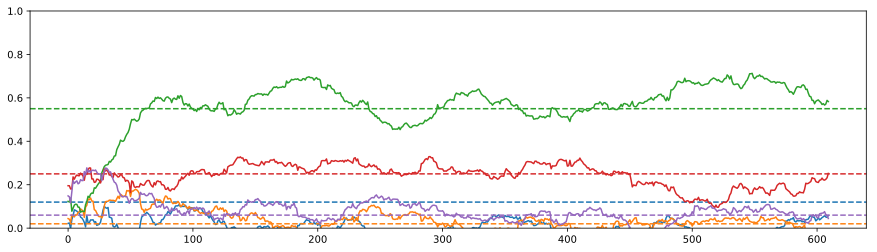

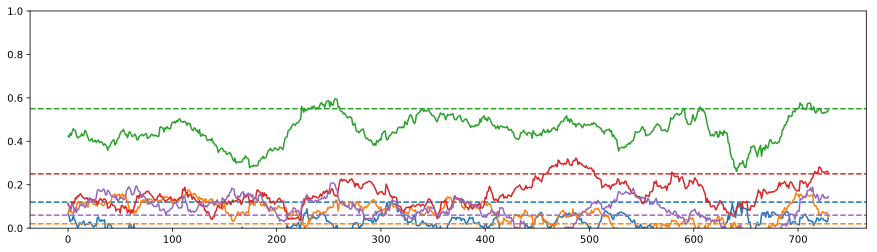

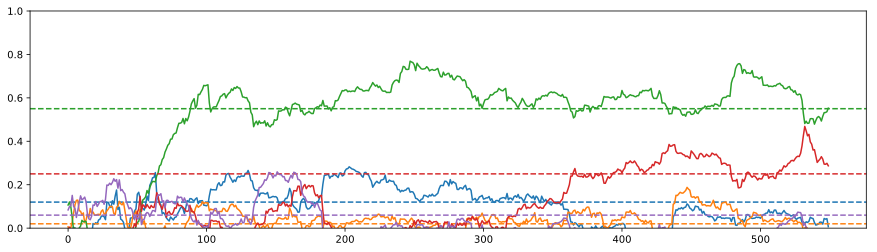

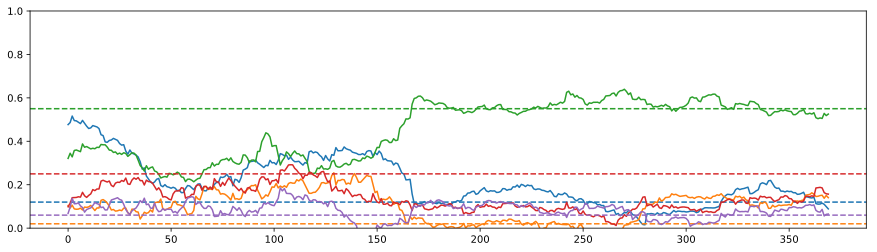

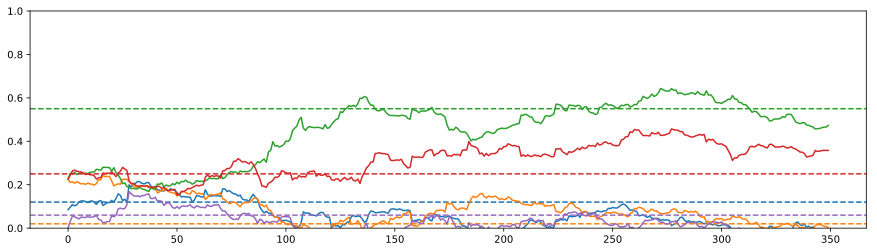

...

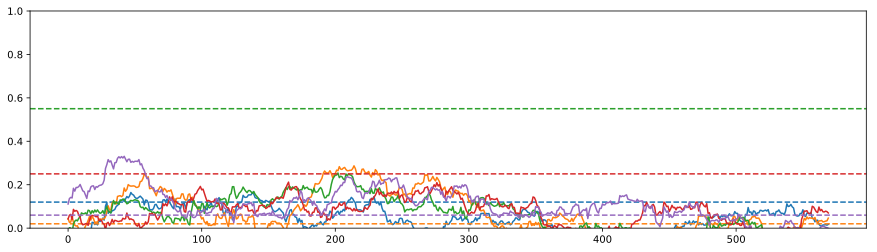

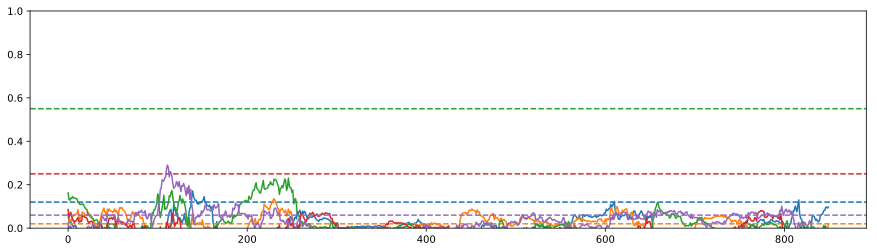

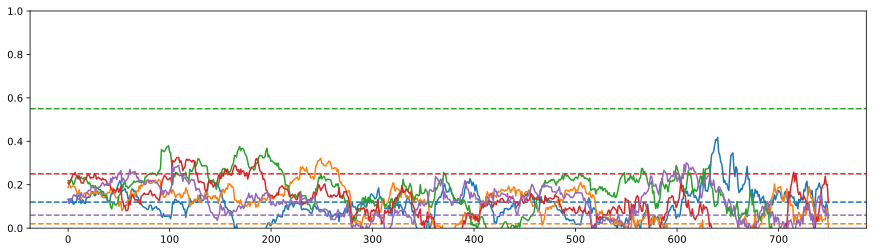

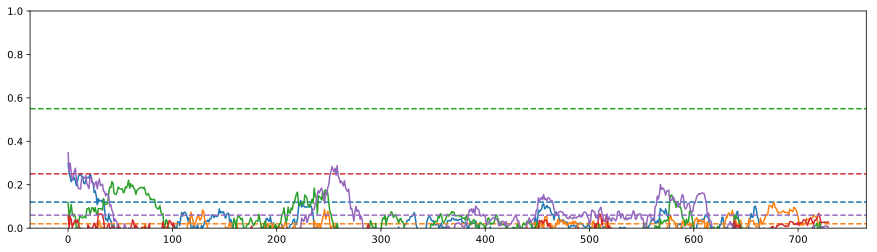

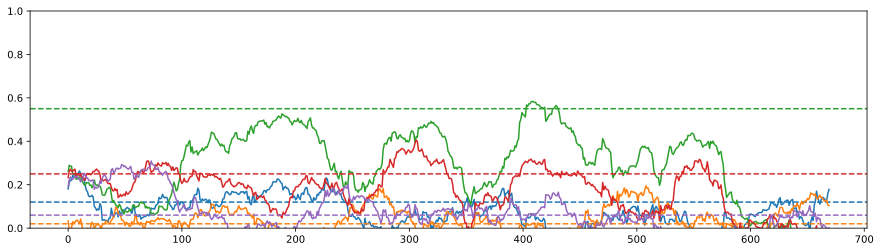

In [21]:
def plot_subject_coefficients(coefficients):
    fig, axes = plt.subplots(1, 1, figsize=(15, 4))
    cols = ["bars" + str(i + 1) for i in range(5)]
    for bar in range(5):
        axes.plot(coefficients[:, bar], color="C" + str(bar))
        axes.axhline(y=beta[bar], linestyle="--", color="C" + str(bar))
    axes.set_ylim([0, 1])
        
# Plot subject coefficients in ascending order of error
sort_order = np.argsort(avg_sum_square_errors)
for subject in sort_order:
    subject_coefficients = extract_subject_coefficients(coef, subject)
    plot_subject_coefficients(subject_coefficients)

# Plot the average learner and non-learner curves up to the point where they all have trial data

In [104]:
def get_min_trials(coefficients):
    num_subjects = coefficients.shape[0]
    min_trials = np.inf
    for subject in range(num_subjects):
        subject_coefficients = extract_subject_coefficients(coef, subject)
        num_trials = subject_coefficients.shape[0]
        if min_trials > num_trials:
            min_trials = num_trials
    return min_trials


def get_dataframe_of_coefficients(coefficients, num_trials, learner_indices):
    weight_dict = {key: f"weight_{key}" for key in range(6)}
    columns = [
        "subject_number",
        "learner",
        "trial",
        "weight_num",
        "weight",
#         "weight_1",
#         "weight_2",
#         "weight_3",
#         "weight_4",
#         "weight_5",
#         "constant_weight"
    ]
    index = []
    data = pd.DataFrame(index=index, columns=columns)
    data_template = data.copy()
    num_subjects = coefficients.shape[0]
    frames = []
    for subject in range(num_subjects):
#         set_trace()
#         print(subject)
        subject_data = data_template.copy()
        subject_coefficients = extract_subject_coefficients(coef, subject)
        if subject in learner_indices:
            learner = True
        else:
            learner = False
        for trial, row in enumerate(subject_coefficients[:num_trials, :]):
#             new_row = np.insert(row, 0, [subject, learner, trial])
#             subject_data = subject_data.append(
#                 pd.DataFrame([new_row], index=["e"], columns=subject_data.columns)
#             )
            for weight_num, weight in enumerate(row):
                weight_name = weight_dict[weight_num]
                new_row = [subject, learner, trial, weight_name, weight]
                subject_data = subject_data.append(
                    pd.DataFrame([new_row], index=["e"], columns=subject_data.columns)
                )
            
        frames.append(subject_data)
    data = pd.concat(frames)
    return data


min_trials = get_min_trials(coef)
data_for_plotting = get_dataframe_of_coefficients(
    coef, min_trials, learner_indices
)
data_for_plotting.reset_index(drop=True, inplace=True)
data_for_plotting.shape

(86100, 5)

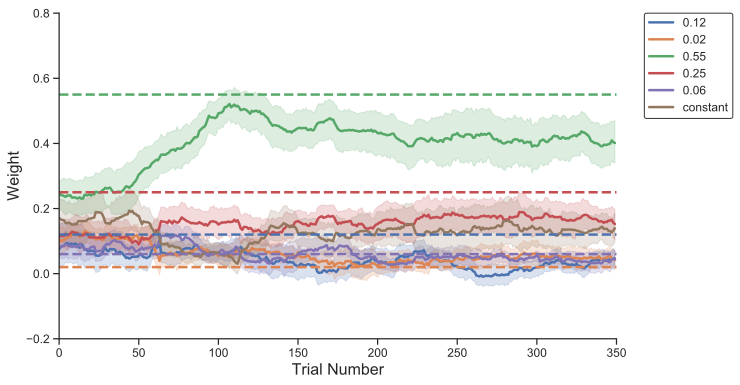

In [145]:
def plot_average_data(data, beta_weights, filename=None):
    """Plots the data for the estimated weights 
    across all trials, along with dashed lines for the 
    constants defined in beta_weights."""
    sns.set(style="ticks", rc={"lines.linewidth": 2.5})
    plt.figure(figsize=(10, 6))
    ax = sns.lineplot(x="trial", y="weight", hue="weight_num", data=data)
    # Draw constant horizontal lines
    for i, beta in enumerate(beta_weights):
        ax.axhline(y=beta, linestyle="--", color="C" + str(i))

    # Legend
    legend_labels = [str(beta) for beta in beta_weights]
    legend_labels.append("constant")

    # move legend outside of plot
    leg = plt.legend(
        bbox_to_anchor=(1.05, 1),
        loc=2,
        borderaxespad=0.0,
        fontsize=12,
        labels=legend_labels,
    )

    # change legend frame color
    leg.get_frame().set_edgecolor("#000000")

    # Change font sizes and labels
    ax.set_ylabel("Weight", fontsize=16)
    ax.set_xlabel("Trial Number", fontsize=16)

    # Set axis limits
    ax.set_ylim([-0.2, 0.8])
    ax.set_xlim([0, data["trial"].max()])

    # Change ticks
    x_tick_step = 50
    plt.xticks(np.arange(0, data["trial"].max() + x_tick_step, x_tick_step))
    ax.tick_params(labelsize=12)

    # Remove top and right borders
    sns.despine()

    # Save figure
    if filename is not None:
        plt.savefig(filename)


learner_data = data_for_plotting[data_for_plotting["learner"] == 1]
plot_average_data(learner_data, beta_weights, filename="learner.svg")

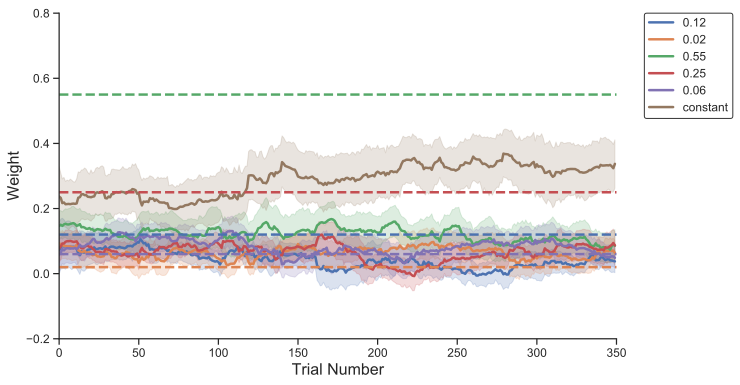

In [146]:
non_learner_data = data_for_plotting[data_for_plotting["learner"] == 0]
plot_average_data(non_learner_data, beta_weights, filename="non-learner.svg")